# Data mining \& clustering

The goal if this practical is to adress the folowing problem: 
<center style="color:red" >  Given XXX raw, unlabeled documents, ... How to exploit/understand/represent them?</center>

In the previous week, we have seen how to represent textual data with the Bag of Words (BoW) model:
$$X = 
	\begin{matrix} 
	 & \textbf{t}_j \\
	 & \downarrow \\
	\textbf{d}_i \rightarrow &
	\begin{pmatrix} 
	x_{1,1} & \dots & x_{1,d} \\
	\vdots & \ddots & \vdots \\
	x_{N,1} & \dots & x_{N,d} \\
	\end{pmatrix}
	\end{matrix}
	$$

From this BoW representation, we want to answer the following questions:
1. Which clustering algorithm to choose?
    - K-means, LSA, pLSA, LDA
1. What results to expect?
    - Semantics, noise cleaning, etc...
1. Which qualitative and quantitative analyses to understand the groups?
[comment]: <> (%1. Comment boucler, itérer pour améliorer la qualité du processus?)


<span style="color:magenta" > In this practical, we use a **labeled dataset** in order to evaluate performances with quantitative and well-defined metrics. </span>


In [1]:
import numpy as np
import matplotlib.pyplot as plt

import codecs
import re
import os.path
import sklearn

## Data loading



In [2]:
from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train')

In [3]:
# conversion BoW + tf-idf
from sklearn.feature_extraction.text import TfidfVectorizer
#vectorizer = TfidfVectorizer() 
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000, stop_words='english')

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)

# sparsity measure = 44 active words over 1000 per document (157 over 130000) !!
print(vectors.nnz / float(vectors.shape[0]))

(11314, 1000)
44.164928407283014


In [4]:
# retrieve words
print([(i,vectorizer.get_feature_names_out()[i]) \
       for i in np.random.randint(vectors.shape[1], size=10)])

[(472, 'hp'), (937, 'useful'), (731, 'pub'), (629, 'needed'), (45, '36'), (590, 'mb'), (480, 'illinois'), (472, 'hp'), (467, 'hold'), (903, 'times')]


In [5]:
# labels (only for evaluation)
Y = newsgroups_train.target
print(len(Y))
print(Y[:10]) 
print([newsgroups_train.target_names[i] for i in Y[:20]]) # vraie classe

11314
[ 7  4  4  1 14 16 13  3  2  4]
['rec.autos', 'comp.sys.mac.hardware', 'comp.sys.mac.hardware', 'comp.graphics', 'sci.space', 'talk.politics.guns', 'sci.med', 'comp.sys.ibm.pc.hardware', 'comp.os.ms-windows.misc', 'comp.sys.mac.hardware', 'rec.motorcycles', 'talk.religion.misc', 'comp.sys.mac.hardware', 'sci.space', 'misc.forsale', 'alt.atheism', 'comp.graphics', 'rec.autos', 'sci.electronics', 'comp.windows.x']


# 0) Word clouds 
### Drawing word clouds from the raw corpus or words' frequencies :  [make word clouds !](https://github.com/amueller/word_cloud)

### Installation
If you are using pip:

`pip install wordcloud`

### If you are using conda, you can install from the conda-forge channel:

`conda install -c conda-forge wordcloud`

### Let's look at the most frequent words in this dataset

In [6]:
data = np.array(newsgroups_train.data)
corpus = "".join(data)
words = corpus.split() # optional args to choose the splitting chars
print("Nb mots=",len(words))
# Lets find the most frequence words Your code here

Nb mots= 3252437


### Plot the N frequent words and verify that its follows a Zipf law

In [7]:
from collections import Counter

N = 20

word_count = Counter(words)
most_common_words = word_count.most_common(N)

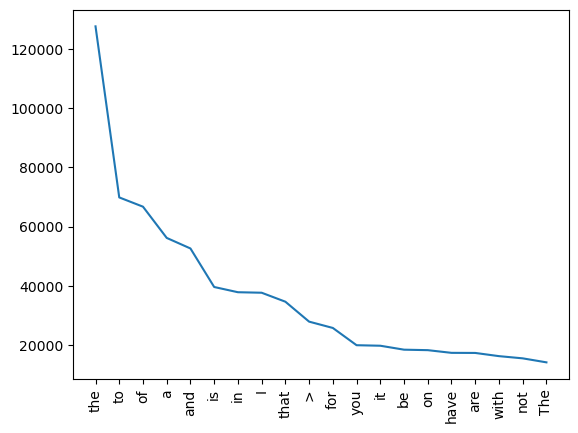

In [8]:

word_list,freqs = [tup[0] for tup in most_common_words],[tup[1] for tup in most_common_words]
plt.xticks(rotation=90)

plt.plot(word_list,freqs)


### Experiment word clouds

(-0.5, 399.5, 199.5, -0.5)

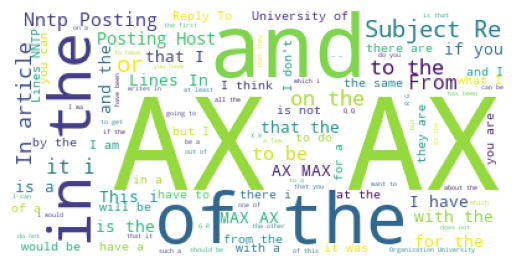

In [9]:
from wordcloud import WordCloud

wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus)            

plt.figure()
plt.imshow(wordcloud)
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

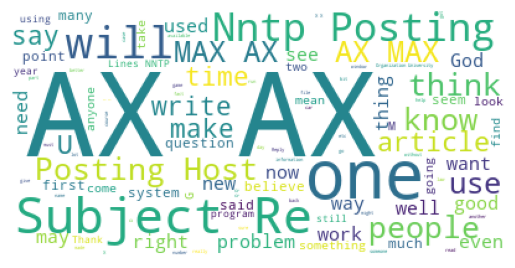

In [10]:
from wordcloud import STOPWORDS # Note: this is the default option           
wordcloud = WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate(corpus) 

plt.figure()
plt.imshow(wordcloud)
plt.axis("off")

### Use word clouds with generate\_from\_frequencies. 
N.B.: retrieve the most words frequencies using a CountVectorizer

In [11]:
from sklearn.feature_extraction.text import CountVectorizer

cv = CountVectorizer(stop_words='english')
cv_fit = cv.fit_transform(newsgroups_train.data)
word_frequencies = cv_fit.toarray().sum(axis=0)
sum_words = cv_fit.sum(axis=0)

words_freq = [(word, sum_words[0, idx]) for word, idx in cv.vocabulary_.items()]
words_freq = dict(sorted(words_freq, key = lambda x: x[1], reverse=True))







(-0.5, 399.5, 199.5, -0.5)

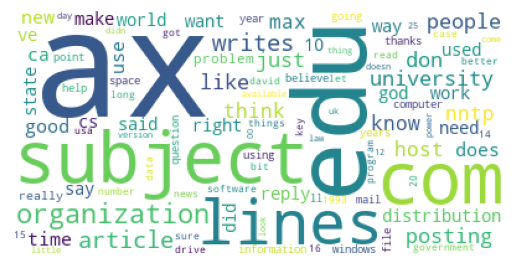

In [12]:
wordcloud = WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate_from_frequencies(words_freq)

plt.figure()
plt.imshow(wordcloud)
plt.axis("off")

### Drawing word clouds from classes


In [13]:
punctuation = r"[\!\"\#\$\%\&\'\(\)\*\+\,\-\.\/\:\;\<\=\>\?\@\[\\\]\^\_\`\{\|\}\~\n\t]"
corpus_punc = re.sub(punctuation, " ", corpus)
corpus_punc = re.sub('( )+', ' ', corpus_punc).lower()
corpus_punc[:1000]

def word_cloud_from_classes(Y):
    for y in np.unique(Y):
        idx = np.where(Y==y)[0]
        corpus_y = ' '.join(data[idx])
        corpus_y = re.sub('( )+', ' ', re.sub(punctuation, " ", corpus_y))
        wordcloud = WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate(corpus_y) 
        plt.figure()
        plt.title(y)
        plt.imshow(wordcloud)
        plt.axis("off")

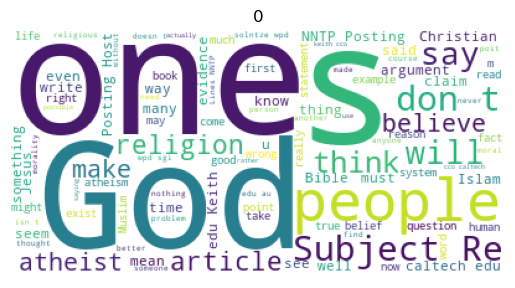

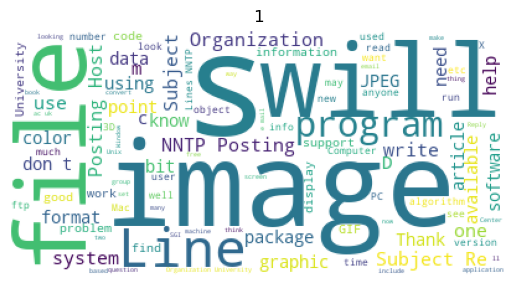

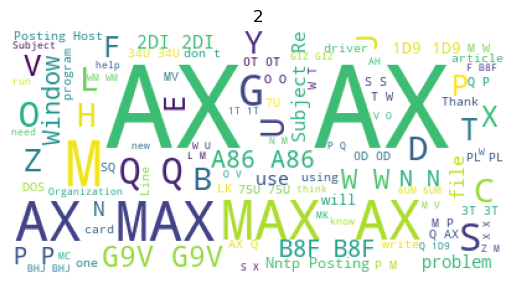

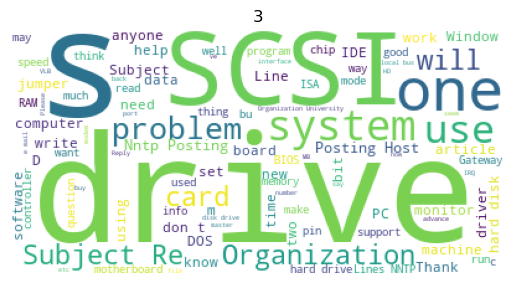

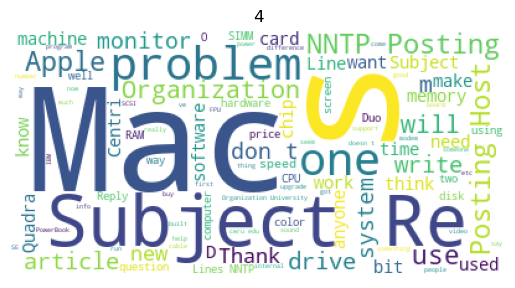

...

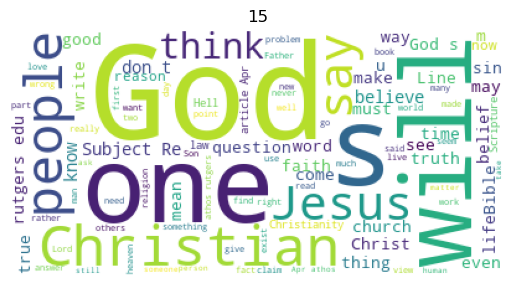

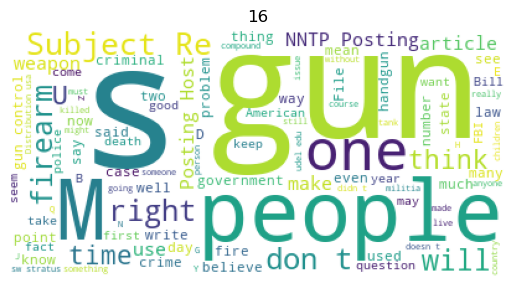

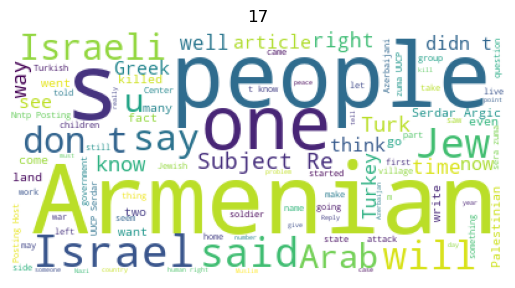

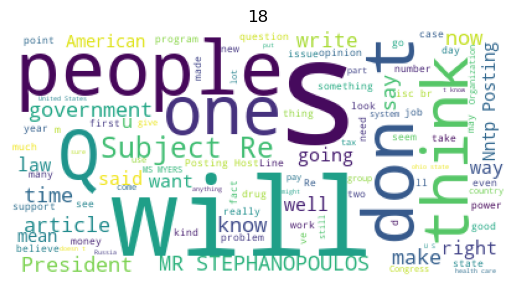

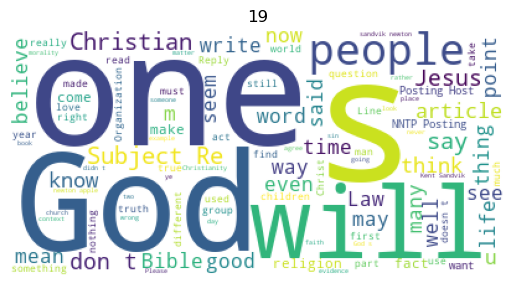

In [14]:
word_cloud_from_classes(Y)

# 1) Clustering algorithm: K-Means

**Let's start by the most famous and simple unsupervised algorithm: $k$-means!**
Look at [sklear documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
and apply it to your BoW matrix.


In [18]:
from sklearn.cluster import KMeans
# your code here
kmeans = KMeans(n_clusters=20, random_state=0, max_iter=10).fit(vectors)
# Getting clusters:
kmeans.cluster_centers_


array([[0.00481251, 0.00431009, 0.00048919, ..., 0.00481887, 0.01265084,
        0.00097928],
       [0.00369518, 0.01008388, 0.00139004, ..., 0.01172087, 0.00496925,
        0.00488701],
       [0.00390038, 0.00431445, 0.0023992 , ..., 0.00616613, 0.00405261,
        0.00336554],
       ...,
       [0.00050777, 0.00514748, 0.00089056, ..., 0.00369742, 0.00111354,
        0.        ],
       [0.00836867, 0.0035352 , 0.        , ..., 0.00816881, 0.0031431 ,
        0.01436739],
       [0.0015631 , 0.00515836, 0.00593669, ..., 0.00522794, 0.00822491,
        0.00154939]])

### Clustering Analysis: 
1. **Qualtitative:**
    - Look at the most important words for each cluster
    - Perform cluster assignement to each document, and compute word cloud on the document (raw text or frequencies)
2. **Quantitative:**
    - Compute cluster "purity": $p_j= \frac{|y^*|}{|C_j|}$, where $y^*$ is the most frequent (GT) label in cluster $C$ $\Rightarrow$ $p = \sum\limits_j |C_j| p_j$
    - Compute [Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.rand_score.html) and [Adjusted Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html#sklearn.metrics.adjusted_rand_score) 

In [22]:
cluster_mfw = [np.argmax(kmeans.cluster_centers_[i]) for i in range(len(kmeans.cluster_centers_))]
for i,e in enumerate(cluster_mfw):
    print(f'most frequent word in cluster {i+1} : ',words[e])

most frequent word in cluster 1 :  disk
most frequent word in cluster 2 :  Division
most frequent word in cluster 3 :  poll.
most frequent word in cluster 4 :  >
most frequent word in cluster 5 :  adapters,
most frequent word in cluster 6 :  i
most frequent word in cluster 7 :  daily
most frequent word in cluster 8 :  the
most frequent word in cluster 9 :  is
most frequent word in cluster 10 :  power
most frequent word in cluster 11 :  computer
most frequent word in cluster 12 :  makes
most frequent word in cluster 13 :  supposed
most frequent word in cluster 14 :  of
most frequent word in cluster 15 :  I'd
most frequent word in cluster 16 :  attained,
most frequent word in cluster 17 :  don't
most frequent word in cluster 18 :  1985.
most frequent word in cluster 19 :  on
most frequent word in cluster 20 :  of


In [14]:
assignments = kmeans.predict(vectors)
print(assignments)


NameError: name 'kmeans' is not defined

# 2) Latent Semantic Analysis (LSA <=> SVD) 


**Remember the LSA factorziation**: 
$$ 
\begin{matrix} 
 & X  &\!\!\!\!\!=\!\!\!\!\!& U  & \Sigma & V^T \\
  & \textbf{t}_j   &  & \hat{ \textbf{d}_i} & &  \\
 & \downarrow  &  &\downarrow  & & \\
\textbf{d}_i \rightarrow 
&
\begin{pmatrix} 
x_{1,1} & \dots & x_{1,d} \\
\\
\vdots & \ddots & \vdots \\
\\
x_{N,1} & \dots & x_{N,d} \\
\end{pmatrix}
&
\!\!\!\!\!=\!\!\!\!\!
%&
%(\hat{ \textbf{t}_j}) \rightarrow
&
\begin{pmatrix} 
\begin{pmatrix} &  \textbf{u}_1 &  \end{pmatrix} \\
\vdots \\
\begin{pmatrix}  & \textbf{u}_k &  \end{pmatrix}
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix} 
\sigma_1 & \dots & 0 \\
\vdots & \ddots & \vdots \\
0 & \dots & \sigma_k \\
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix} 
\begin{pmatrix} \, \\ \, \\ \textbf{v}_1 \\ \, \\ \,\end{pmatrix} 
\dots
\begin{pmatrix} \, \\ \, \\ \textbf{v}_k \\ \, \\ \, \end{pmatrix}
\end{pmatrix}
\end{matrix}
$$

- Look at [SVD doc in skelarn](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html#sklearn.decomposition.TruncatedSVD)
- Do the same qualitative/quantitative evaluation than with K-Means
- You can also use LSA as a pre-processing step for K-Means, *i.e.* running K-Means on $\boldsymbol{U}$ matrix above
    - N.B. : try without/with $\ell_2$ normalization of $\boldsymbol{U}$'s rows before running  K-Means
    - You can also benefit from LSA pre-processing for using [t-SNE visualization](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) (see code below)


In [27]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

# t-SNE from the U matrix computed by LSA

svd = TruncatedSVD()
vectors_truncated = svd.fit_transform(vectors)
U = vectors_truncated / svd.singular_values_ ## document-to-topic similarity Matrix obtained by SVD
SIGMA = np.diag(svd.singular_values_) ## strength of topic diagonal matrix 
VT = svd.components_ ## word-to-topic similarity matrix

tsne = TSNE(n_components=2, init='pca',n_iter=5000, verbose=2)
tsne_mat = tsne.fit_transform(U)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11314 samples in 0.075s...
[t-SNE] Computed neighbors for 11314 samples in 0.199s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11314
[t-SNE] Computed conditional probabilities for sample 2000 / 11314
[t-SNE] Computed conditional probabilities for sample 3000 / 11314
[t-SNE] Computed conditional probabilities for sample 4000 / 11314
[t-SNE] Computed conditional probabilities for sample 5000 / 11314
[t-SNE] Computed conditional probabilities for sample 6000 / 11314
[t-SNE] Computed conditional probabilities for sample 7000 / 11314
[t-SNE] Computed conditional probabilities for sample 8000 / 11314
[t-SNE] Computed conditional probabilities for sample 9000 / 11314
[t-SNE] Computed conditional probabilities for sample 10000 / 11314
[t-SNE] Computed conditional probabilities for sample 11000 / 11314
[t-SNE] Computed conditional probabilities for sample 11314 / 11314
[t-SNE] Mean sigma: 0.000296
[t-SNE] Computed cond

[t-SNE] Iteration 3800: error = 0.7238685, gradient norm = 0.0004381 (50 iterations in 1.363s)
[t-SNE] Iteration 3850: error = 0.7235618, gradient norm = 0.0004352 (50 iterations in 1.357s)
[t-SNE] Iteration 3900: error = 0.7231768, gradient norm = 0.0004869 (50 iterations in 1.377s)
[t-SNE] Iteration 3950: error = 0.7228494, gradient norm = 0.0004914 (50 iterations in 1.401s)
[t-SNE] Iteration 4000: error = 0.7224531, gradient norm = 0.0004741 (50 iterations in 1.394s)
[t-SNE] Iteration 4050: error = 0.7221097, gradient norm = 0.0004585 (50 iterations in 1.388s)
[t-SNE] Iteration 4100: error = 0.7217678, gradient norm = 0.0004452 (50 iterations in 1.372s)
[t-SNE] Iteration 4150: error = 0.7213993, gradient norm = 0.0004663 (50 iterations in 1.358s)
[t-SNE] Iteration 4200: error = 0.7211242, gradient norm = 0.0004476 (50 iterations in 1.292s)
[t-SNE] Iteration 4250: error = 0.7207789, gradient norm = 0.0004364 (50 iterations in 1.346s)
[t-SNE] Iteration 4300: error = 0.7204526, gradien

(11314, 2)


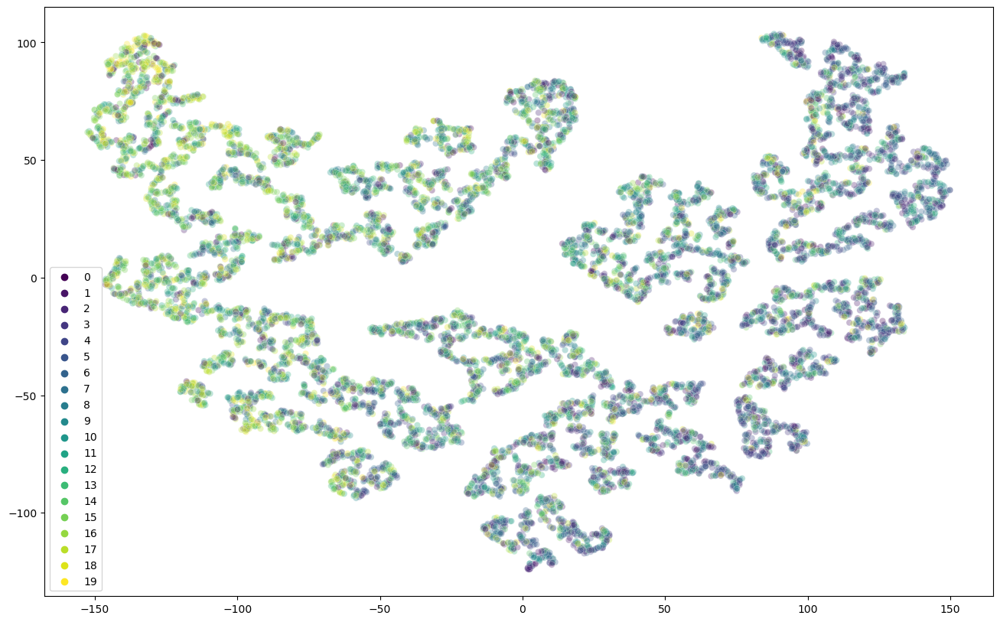

In [39]:
import seaborn as sns

print(tsne_mat.shape)
plt.figure(figsize=(16,10))
sns.scatterplot(
    x=tsne_mat[:,0], y=tsne_mat[:,1],
    hue=Y,
    palette='viridis',
    legend="full",
    alpha=0.3
)
plt.show()

In [44]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

# t-SNE from the U matrix computed by LSA, I will use 3 dimensions this time

svd = TruncatedSVD(n_components=3)
vectors_truncated = svd.fit_transform(vectors)
U = vectors_truncated / svd.singular_values_ ## document-to-topic similarity Matrix obtained by SVD
SIGMA = np.diag(svd.singular_values_) ## strength of topic diagonal matrix 
VT = svd.components_ ## word-to-topic similarity matrix

tsne = TSNE(n_components=3, init='pca',n_iter=5000, verbose=2)
tsne_mat = tsne.fit_transform(U)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 11314 samples in 0.004s...
[t-SNE] Computed neighbors for 11314 samples in 0.275s...
[t-SNE] Computed conditional probabilities for sample 1000 / 11314
[t-SNE] Computed conditional probabilities for sample 2000 / 11314
[t-SNE] Computed conditional probabilities for sample 3000 / 11314
[t-SNE] Computed conditional probabilities for sample 4000 / 11314
[t-SNE] Computed conditional probabilities for sample 5000 / 11314
[t-SNE] Computed conditional probabilities for sample 6000 / 11314
[t-SNE] Computed conditional probabilities for sample 7000 / 11314
[t-SNE] Computed conditional probabilities for sample 8000 / 11314
[t-SNE] Computed conditional probabilities for sample 9000 / 11314
[t-SNE] Computed conditional probabilities for sample 10000 / 11314
[t-SNE] Computed conditional probabilities for sample 11000 / 11314
[t-SNE] Computed conditional probabilities for sample 11314 / 11314
[t-SNE] Mean sigma: 0.000997
[t-SNE] Computed cond

[t-SNE] Iteration 3800: error = 1.1160145, gradient norm = 0.0000272 (50 iterations in 2.407s)
[t-SNE] Iteration 3850: error = 1.1159391, gradient norm = 0.0000255 (50 iterations in 2.400s)
[t-SNE] Iteration 3900: error = 1.1158805, gradient norm = 0.0000241 (50 iterations in 2.368s)
[t-SNE] Iteration 3950: error = 1.1157587, gradient norm = 0.0000232 (50 iterations in 2.408s)
[t-SNE] Iteration 4000: error = 1.1156710, gradient norm = 0.0000313 (50 iterations in 2.384s)
[t-SNE] Iteration 4050: error = 1.1155691, gradient norm = 0.0000231 (50 iterations in 2.415s)
[t-SNE] Iteration 4100: error = 1.1155119, gradient norm = 0.0002142 (50 iterations in 2.395s)
[t-SNE] Iteration 4150: error = 1.1155672, gradient norm = 0.0000868 (50 iterations in 2.446s)
[t-SNE] Iteration 4200: error = 1.1155908, gradient norm = 0.0000613 (50 iterations in 2.403s)
[t-SNE] Iteration 4250: error = 1.1154721, gradient norm = 0.0000543 (50 iterations in 2.413s)
[t-SNE] Iteration 4300: error = 1.1153405, gradien

In [49]:
import pandas as pd
import plotly.express as px

df_reduced = pd.DataFrame(tsne_mat, columns=['x', 'y', 'z'])
df_reduced['labels'] = Y

# Plot the t-SNE results in 3D using plotly
fig = px.scatter_3d(df_reduced, x='x', y='y', z='z', color='labels')
fig.show()

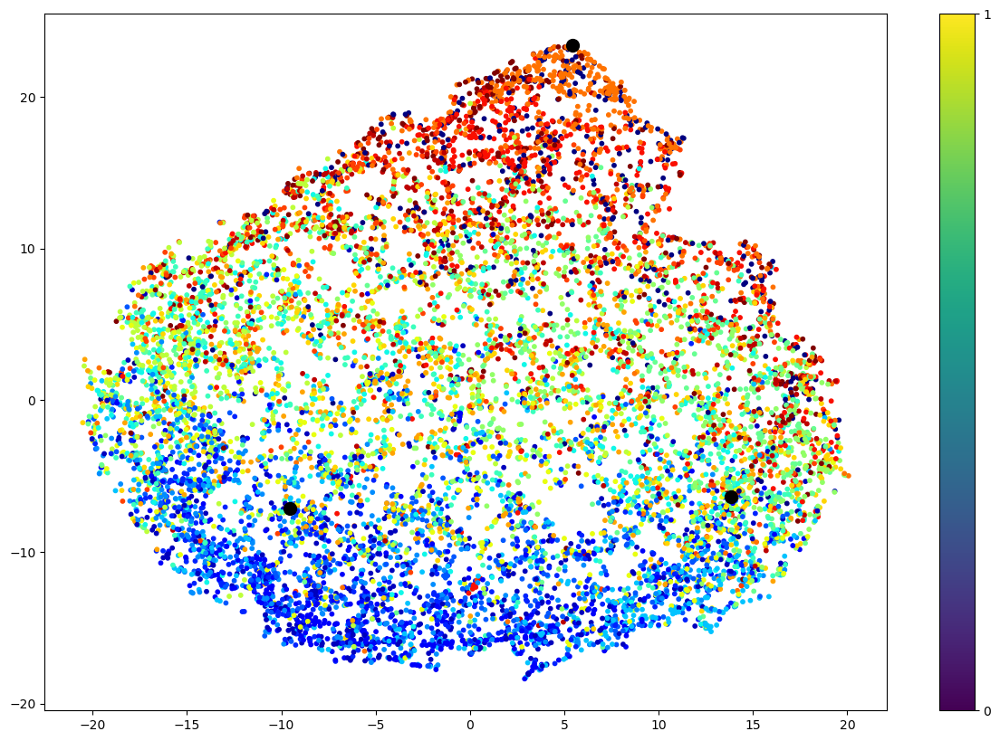

In [51]:
import seaborn as sns
import matplotlib.cm as cm

NN2cluster = np.argmax(np.abs(vectors_truncated), axis=0)

cmap = cm.tab20
cmap = cm.get_cmap('hsv', 20) 
cmap = cm.get_cmap('jet', 20)
#cmap = cm.tab20

plt.figure(figsize=(15,10))
plt.scatter(tsne_mat[:,0],tsne_mat[:,1], c=Y, cmap=cmap, s=10)
plt.scatter(tsne_mat[NN2cluster[:],0],tsne_mat[NN2cluster[:],1], c='black', s=100)
#plt.scatter(tsne_mat[NN2cluster2[:],0],tsne_mat[NN2cluster2[:],1], c='red', s=100)
plt.colorbar(ticks=range(20))

# 3) Latent Dirichlet Allocation (LDA)

Perform the same experiments with LDA:
- LDA
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html


**Start with a CountVectorizer**

In [12]:
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import CountVectorizer

# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
vectorizer = CountVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1),
                        tokenizer = tokenizer.tokenize, max_df=0.95, min_df=2, max_features=1000)

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)
print(vectors.nnz / float(vectors.shape[0]))



/Users/allaa/miniconda3/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


(11314, 1000)
48.02527841612162


In [20]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

# t-SNE from the U matrix computed by LSA

lda = LatentDirichletAllocation(n_components=len(np.unique(Y)))
vectors_allocated = lda.fit_transform(vectors)

## LDA-viz

In [21]:
from __future__ import print_function

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()


pyLDAvis.sklearn.prepare(lda,vectors,vectorizer)

/Users/allaa/miniconda3/lib/python3.10/site-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
12     0.154111 -0.056675       1        1  10.770128
0     -0.429114 -0.114385       2        1   8.536690
11    -0.356231  0.072327       3        1   8.328059
7      0.059080  0.068422       4        1   7.089594
10     0.119870  0.033825       5        1   6.282384
17     0.146488 -0.090329       6        1   6.268396
3     -0.244832  0.224746       7        1   5.953141
16     0.003778  0.173007       8        1   5.792960
19     0.070995  0.095251       9        1   5.483237
14     0.166347 -0.123284      10        1   4.855788
8      0.132429 -0.095508      11        1   4.600895
4      0.075496  0.022542      12        1   4.460134
13     0.145256 -0.053671      13        1   4.339082
1      0.063850  0.090021      14        1   4.047584
15     0.109757 -0.091848      15        1   3.669436
6      0.074329  0.049738      16        1   3.657479
18     0.039676  0.085073      17        1   2.712217
9     -0.086579  0.122874      18        1   1.818155
2      0.059148 -0.109966      19        1   1.036265
5     -0.303853 -0.302162      20        1   0.298374, topic_info=        Term          Freq         Total Category  logprob  loglift
146       ax  62669.000000  62669.000000  Default  30.0000  30.0000
992        x   9482.000000   9482.000000  Default  29.0000  29.0000
667        p   5382.000000   5382.000000  Default  28.0000  28.0000
243      com  12221.000000  12221.000000  Default  27.0000  27.0000
0          0   9485.000000   9485.000000  Default  26.0000  26.0000
..       ...           ...           ...      ...      ...      ...
705  posting      4.400593   5492.465345  Topic20  -6.5983  -1.3148
428     good      2.887766   3753.138521  Topic20  -7.0196  -1.3553
871        t      8.906873  18782.554026  Topic20  -5.8932  -1.8393
782        s      9.888444  22296.341530  Topic20  -5.7887  -1.9062
130  article      1.903138   7459.901075  Topic20  -7.4365  -2.4592

[961 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         2  0.007696     0
0         3  0.232672     0
0         7  0.703498     0
0         8  0.023721     0
0        18  0.032260     0
...     ...       ...   ...
997      19  0.003607  york
999       2  0.061862     z
999       3  0.829566     z
999       8  0.107586     z
999      17  0.000384     z

[6532 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[13, 1, 12, 8, 11, 18, 4, 17, 20, 15, 9, 5, 14, 2, 16, 7, 19, 10, 3, 6])

In [22]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

# t-SNE from the U matrix computed by LSA

lda = LatentDirichletAllocation()
vectors_allocated = lda.fit_transform(vectors)

pyLDAvis.sklearn.prepare(lda,vectors,vectorizer)

/Users/allaa/miniconda3/lib/python3.10/site-packages/pyLDAvis/_prepare.py:247: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  by='saliency', ascending=False).head(R).drop('saliency', 1)


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.157269  0.094697       1        1  15.712780
3      0.427765  0.092620       2        1  15.570396
8     -0.116255  0.032060       3        1  11.923260
6     -0.128199  0.041641       4        1  10.736674
7     -0.080364  0.000841       5        1  10.278679
1      0.052081 -0.212221       6        1   9.178883
2      0.253207 -0.028234       7        1   7.841548
9     -0.061743 -0.171241       8        1   7.323975
0     -0.126061 -0.023832       9        1   6.765191
4     -0.063162  0.173667      10        1   4.668614, topic_info=       Term          Freq         Total Category  logprob  loglift
146      ax  62447.000000  62447.000000  Default  30.0000  30.0000
347     edu  21106.000000  21106.000000  Default  29.0000  29.0000
9         1  15177.000000  15177.000000  Default  28.0000  28.0000
992       x   9194.000000   9194.000000  Default  27.0000  27.0000
0         0   9458.000000   9458.000000  Default  26.0000  26.0000
..      ...           ...           ...      ...      ...      ...
331     don    458.759422   5950.065714  Topic10  -4.7018   0.5017
898    time    356.073616   4110.548677  Topic10  -4.9552   0.6181
549    like    371.303134   5869.689077  Topic10  -4.9133   0.3038
515    just    316.164257   5591.403827  Topic10  -5.0740   0.1916
988  writes    319.183792   7775.943187  Topic10  -5.0645  -0.1287

[554 rows x 6 columns], token_table=      Topic      Freq   Term
term                        
0         2  0.164511      0
0         6  0.092194      0
0         7  0.732371      0
0         8  0.000106      0
0        10  0.010784      0
...     ...       ...    ...
995      10  0.112898  years
999       2  0.860382      z
999       6  0.102859      z
999       8  0.035575      z
999      10  0.000773      z

[2586 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 4, 9, 7, 8, 2, 3, 10, 1, 5])

# Performances evaluation

**Compare the different approaches wrt three quantitative metrics.**